In [1]:
import numpy as np
import os

file_list = [
    "HighFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_ground_truth.npy",
    "HighFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_initial_conditions.npy",
    "HighFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_predictions.npy",
    "TurbL1_wo_HDS_McWilliams2d_ablation_ground_truth.npy",
    "TurbL1_wo_HDS_McWilliams2d_ablation_initial_conditions.npy",
    "TurbL1_wo_HDS_McWilliams2d_ablation_predictions.npy",
    "TurbL1_wo_MG_McWilliams2d_ablation_ground_truth.npy",
    "TurbL1_wo_MG_McWilliams2d_ablation_initial_conditions.npy",
    "TurbL1_wo_MG_McWilliams2d_ablation_predictions.npy",
    "LowFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_ground_truth.npy",
    "LowFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_initial_conditions.npy",
    "LowFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_predictions.npy"
]

dimension_info = []

for file_name in file_list:
    if not os.path.isfile(file_name):
        print(f"File not found: {file_name}")
        continue
    
    try:
        data = np.load(file_name)
        dims = data.shape
        dimension_info.append((file_name, dims))
    except Exception as e:
        print(f"Error loading {file_name}: {str(e)}")

print("Dim information：")
print("-" * 80)
for file_name, dims in dimension_info:
    print(f"{file_name:<75} | Shape: {dims}")

Dim information：
--------------------------------------------------------------------------------
HighFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_ground_truth.npy         | Shape: (128, 99, 1, 128, 128)
HighFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_initial_conditions.npy   | Shape: (128, 1, 1, 128, 128)
HighFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_predictions.npy          | Shape: (128, 99, 1, 128, 128)
TurbL1_wo_HDS_McWilliams2d_ablation_ground_truth.npy                        | Shape: (128, 99, 1, 128, 128)
TurbL1_wo_HDS_McWilliams2d_ablation_initial_conditions.npy                  | Shape: (128, 1, 1, 128, 128)
TurbL1_wo_HDS_McWilliams2d_ablation_predictions.npy                         | Shape: (128, 99, 1, 128, 128)
TurbL1_wo_MG_McWilliams2d_ablation_ground_truth.npy                         | Shape: (128, 99, 1, 128, 128)
TurbL1_wo_MG_McWilliams2d_ablation_initial_conditions.npy                   | Shape: (128, 1, 1, 128, 128)
TurbL1_wo_MG_McWilliams2d_ablation_predic

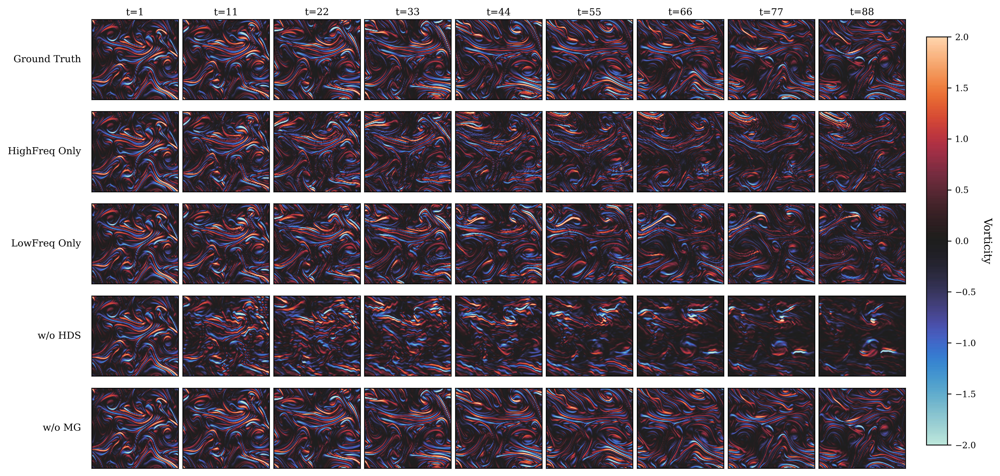

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
import matplotlib as mpl

# --- Nature Style Configuration ---
plt.style.use('default')
mpl.rcParams.update({
    'font.size': 10,
    'axes.titlesize': 12,
    'axes.labelsize': 10,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 9,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'lines.linewidth': 1.5,
    'axes.linewidth': 0.8,
    'xtick.major.width': 0.8,
    'ytick.major.width': 0.8,
    'grid.linewidth': 0.5,
    'font.family': 'DejaVu Serif',
    'axes.grid': False,
    'grid.alpha': 0.3
})

# --- Configuration Parameters ---
VISUALIZATION_PARAMS = {
    'cmap_field': sns.cm.icefire,
    'vmin': -2,
    'vmax': 2,
    'save_path': "./visualization_results"
}

# Create save directory if it doesn't exist
import os
os.makedirs(VISUALIZATION_PARAMS['save_path'], exist_ok=True)

datasets = {
    'Ground Truth': np.load('HighFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_ground_truth.npy'),
    'HighFreq Only': np.load('HighFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_predictions.npy'),
    'LowFreq Only': np.load('LowFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_predictions.npy'),
    'w/o HDS': np.load('TurbL1_wo_HDS_McWilliams2d_ablation_predictions.npy'),
    'w/o MG': np.load('TurbL1_wo_MG_McWilliams2d_ablation_predictions.npy')
}

time_steps = [0, 10, 21, 32, 43, 54, 65, 76, 87]  # 对应1,11,22,...,99
n_cols = len(time_steps)
n_rows = len(datasets)

fig = plt.figure(figsize=(n_cols*1.5, n_rows*1.5))
gs = GridSpec(n_rows, n_cols, wspace=0.05, hspace=0.15)
sample_index = 4
for row_idx, (model_name, data) in enumerate(datasets.items()):
    for col_idx, t in enumerate(time_steps):
        ax = plt.subplot(gs[row_idx, col_idx])
        
        if data.ndim == 5:
            sample_data = data[sample_index, t, 0]  
        else:
            sample_data = data[sample_index, t] 
            
        if sample_data.ndim == 3:  # (128,128,2)
            u = sample_data[..., 0].real
            v = sample_data[..., 1].real
        else:  # (128,128) 
            u = sample_data.real
            v = np.zeros_like(u)
            
        dv_dx = np.gradient(v, axis=1)
        du_dy = np.gradient(u, axis=0)
        vorticity = dv_dx - du_dy
        
        im = ax.imshow(vorticity, 
                      cmap=VISUALIZATION_PARAMS['cmap_field'],
                      vmax=VISUALIZATION_PARAMS['vmax'],
                      vmin=VISUALIZATION_PARAMS['vmin'],
                      aspect='auto')
        
        ax.set_xticks([])
        ax.set_yticks([])
        
        if row_idx == 0:
            ax.set_title(f't={t+1}', pad=4, fontsize=9)
        if col_idx == 0:
            ax.set_ylabel(model_name, 
                         rotation=0, 
                         ha='right', 
                         va='center',
                         fontsize=9,
                         labelpad=10)

cax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = plt.colorbar(im, cax=cax)
cbar.set_label('Vorticity', rotation=270, labelpad=15)
cbar.ax.tick_params(labelsize=8)


save_path = os.path.join(VISUALIZATION_PARAMS['save_path'], f'turbulence_ablation_comparison_{sample_index}.png')
plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=False)
plt.show()

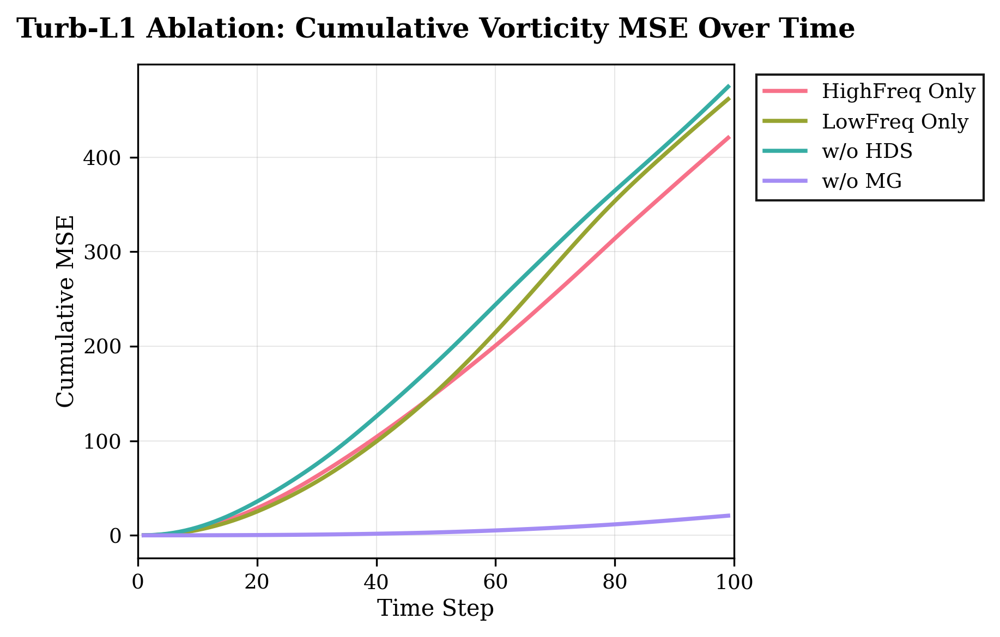

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

# --- Nature Style Configuration ---
plt.style.use('default')
mpl.rcParams.update({
    'font.size': 10,
    'axes.titlesize': 12,
    'axes.labelsize': 10,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'lines.linewidth': 1.5,
    'axes.linewidth': 0.8,
    'xtick.major.width': 0.8,
    'ytick.major.width': 0.8,
    'grid.linewidth': 0.5,
    'font.family': 'DejaVu Serif',
    'axes.grid': True,
    'grid.alpha': 0.3
})

# Load all data
datasets = {
    'HighFreq Only': np.load('HighFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_predictions.npy'),
    'LowFreq Only': np.load('LowFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_predictions.npy'),
    'w/o HDS': np.load('TurbL1_wo_HDS_McWilliams2d_ablation_predictions.npy'),
    'w/o MG': np.load('TurbL1_wo_MG_McWilliams2d_ablation_predictions.npy')
}
ground_truth = np.load('HighFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_ground_truth.npy')

# Calculate MSE for each model at each time step
time_steps = np.arange(1, 100)  # 1-99
mse_results = {}

for model_name, pred_data in datasets.items():
    mse = []
    for t in range(99):  # 0-98 (corresponds to 1-99)
        # Get vorticity for prediction
        if pred_data.ndim == 5:
            pred_sample = pred_data[0, t, 0]  # [sample, time, channel, x, y]
        else:
            pred_sample = pred_data[0, t]
            
        if pred_sample.ndim == 3:  # has velocity components
            u_pred = pred_sample[..., 0].real
            v_pred = pred_sample[..., 1].real
            dv_dx_pred = np.gradient(v_pred, axis=1)
            du_dy_pred = np.gradient(u_pred, axis=0)
            vort_pred = dv_dx_pred - du_dy_pred
        else:
            vort_pred = pred_sample.real
            
        # Get vorticity for ground truth
        gt_sample = ground_truth[0, t, 0] if ground_truth.ndim == 5 else ground_truth[0, t]
        if gt_sample.ndim == 3:
            u_gt = gt_sample[..., 0].real
            v_gt = gt_sample[..., 1].real
            dv_dx_gt = np.gradient(v_gt, axis=1)
            du_dy_gt = np.gradient(u_gt, axis=0)
            vort_gt = dv_dx_gt - du_dy_gt
        else:
            vort_gt = gt_sample.real
            
        # Calculate MSE
        mse.append(np.mean((vort_pred - vort_gt)**2))
    
    mse_results[model_name] = np.array(mse)

# Calculate cumulative MSE
cumulative_mse = {name: np.cumsum(mse) for name, mse in mse_results.items()}

# Create plot
plt.figure(figsize=(6, 4))

# Color palette
palette = sns.color_palette("husl", len(cumulative_mse))

for idx, (model_name, cum_mse) in enumerate(cumulative_mse.items()):
    plt.plot(time_steps, cum_mse, 
             label=model_name, 
             linewidth=1.8,
             color=palette[idx])

plt.xlabel('Time Step', fontsize=10, labelpad=2)
plt.ylabel('Cumulative MSE', fontsize=10, labelpad=2)
plt.title('Turb-L1 Ablation: Cumulative Vorticity MSE Over Time', 
          fontsize=12, pad=12, weight='bold')

plt.legend(frameon=True, fancybox=False, 
           edgecolor='black', 
           framealpha=0.9,
           bbox_to_anchor=(1.02, 1),
           borderpad=0.4)

plt.xlim(1, 99)
plt.xticks(np.arange(0, 101, 20))
plt.grid(True, alpha=0.3)

plt.tight_layout()

# Save figure
save_path = "./visualization_results/cumulative_mse_comparison.png"
plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=False)
plt.show()

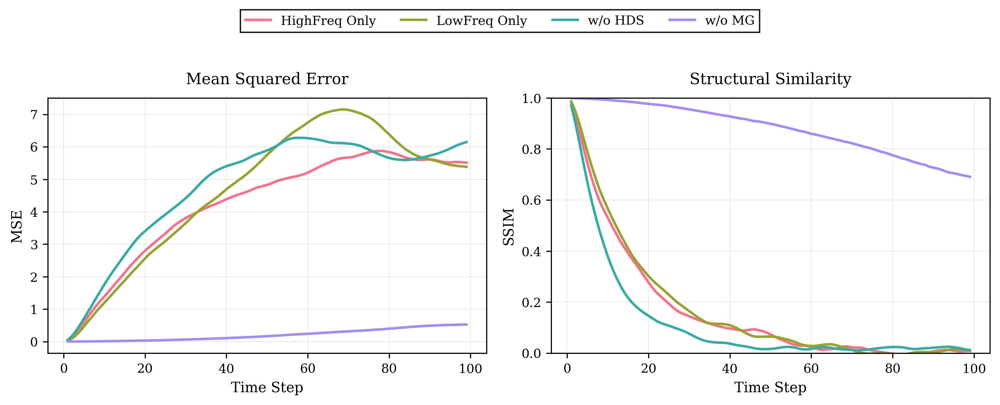

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from skimage.metrics import structural_similarity as ssim

# --- Nature Style Configuration ---
plt.style.use('default')
mpl.rcParams.update({
    'font.size': 10,
    'axes.titlesize': 12,
    'axes.labelsize': 10,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'lines.linewidth': 1.5,
    'axes.linewidth': 0.8,
    'xtick.major.width': 0.8,
    'ytick.major.width': 0.8,
    'grid.linewidth': 0.5,
    'font.family': 'DejaVu Serif',
    'axes.grid': True,
    'grid.alpha': 0.3
})

# Load data
datasets = {
    'HighFreq Only': np.load('HighFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_predictions.npy'),
    'LowFreq Only': np.load('LowFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_predictions.npy'),
    'w/o HDS': np.load('TurbL1_wo_HDS_McWilliams2d_ablation_predictions.npy'),
    'w/o MG': np.load('TurbL1_wo_MG_McWilliams2d_ablation_predictions.npy')
}
ground_truth = np.load('HighFrequencyOnlyTurbL1_McWilliams2d_ablation_exp1_ground_truth.npy')

def calculate_vorticity(data, t):
    """Calculate vorticity field for given time step"""
    if data.ndim == 5:
        sample = data[0, t, 0]  # [sample, time, channel, x, y]
    else:
        sample = data[0, t]
        
    if sample.ndim == 3:  # has velocity components
        u = sample[..., 0].real
        v = sample[..., 1].real
        dv_dx = np.gradient(v, axis=1)
        du_dy = np.gradient(u, axis=0)
        return dv_dx - du_dy
    return sample.real

# Initialize metrics storage
time_steps = np.arange(1, 100)
metrics = {
    'MSE': {name: np.zeros(99) for name in datasets},
    'SSIM': {name: np.zeros(99) for name in datasets}
}

# Calculate metrics
for t in range(99):
    vort_gt = calculate_vorticity(ground_truth, t)
    
    for name, data in datasets.items():
        vort_pred = calculate_vorticity(data, t)
        
        # MSE calculation
        metrics['MSE'][name][t] = np.mean((vort_pred - vort_gt)**2)
        
        # SSIM calculation
        data_range = vort_gt.max() - vort_gt.min()
        metrics['SSIM'][name][t] = ssim(vort_gt, vort_pred, 
                                      data_range=data_range,
                                      win_size=7)

# Create horizontal figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3.5))
palette = sns.color_palette("husl", len(datasets))

# Plot MSE
for idx, name in enumerate(datasets):
    ax1.plot(time_steps, metrics['MSE'][name], 
            label=name, color=palette[idx], linewidth=1.8)
ax1.set_xlabel('Time Step', fontsize=10)
ax1.set_ylabel('MSE', fontsize=10)
ax1.set_title('Mean Squared Error', fontsize=11, pad=10)
ax1.grid(True, alpha=0.3)
ax1.set_xticks(np.arange(0, 101, 20))

# Plot SSIM
for idx, name in enumerate(datasets):
    ax2.plot(time_steps, metrics['SSIM'][name], 
            label=name, color=palette[idx], linewidth=1.8)
ax2.set_xlabel('Time Step', fontsize=10)
ax2.set_ylabel('SSIM', fontsize=10)
ax2.set_title('Structural Similarity', fontsize=11, pad=10)
ax2.set_ylim(0, 1)
ax2.grid(True, alpha=0.3)
ax2.set_xticks(np.arange(0, 101, 20))

# Create common legend
handles, labels = ax1.get_legend_handles_labels()
fig.legend(handles, labels, 
          loc='upper center', 
          bbox_to_anchor=(0.5, 1.15),
          ncol=len(datasets),
          frameon=True,
          fancybox=False,
          edgecolor='black',
          framealpha=0.9)

plt.tight_layout()

# Save figure
save_path = "./visualization_results/horizontal_ssim_mse.png"
plt.savefig(save_path, dpi=300, bbox_inches='tight', transparent=False)
plt.show()